## Uso de Embeddings
### Lectura y procesamiento de datos sobre libros

In [1]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [2]:
import os

os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"

In [3]:
from sentence_transformers import SentenceTransformer
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

#### Carga de datos desde csv

In [4]:
data = pd.read_csv('lectulandia_books.csv')

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62279 entries, 0 to 62278
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   url         62279 non-null  object
 1   titulo      62279 non-null  object
 2   autor       62278 non-null  object
 3   autor_url   62278 non-null  object
 4   sinapsis    47830 non-null  object
 5   imagen_url  62279 non-null  object
 6   generos     62278 non-null  object
dtypes: object(7)
memory usage: 3.3+ MB


Por lo pronto, se opta por trabajar solo con dos variables: **sinopsis y géneros**.

In [6]:
selec_data = data[['sinapsis', 'generos']]
selec_data.head()

,sinapsis,generos
0,La oscuridad de un alma herida es el hogar de ...,Intriga - Novela
1,"El mal medra, y la magia se ha pervertido. En ...",Fantástico - Novela
2,"Durante el funeral de su abuelo, Simon descubr...",Histórico - Novela
3,ATRÉVETE A VIVIR EN EL FASCINANTE MUNDO DE JAM...,Juegos - Manuales y cursos - Referencia
4,"Tras varios años alejado del que fue su hogar,...",Histórico - Novela - Romántico


Se procede a preprocesamientos rápidos relacionados a caracteres especiales y uso de mayúsculas.

In [7]:
selec_data['sinapsis'] = selec_data['sinapsis'].str.lower()

In [8]:
selec_data['generos'] = selec_data['generos'].astype(str)

In [9]:
selec_data['generos'] = selec_data['generos'].str.strip()

In [10]:
# Se busca lo que NO sea letra, espacio o guion
patron = r'[^a-zA-ZáéíóúÁÉÍÓÚñÑ\-\s]'

fuera_de_norma = selec_data[selec_data['generos'].str.contains(patron, na=False)]

print(f"Se encontraron {len(fuera_de_norma)} registros con caracteres especiales.")
fuera_de_norma['generos'].head()

Se encontraron 1531 registros con caracteres especiales.


53                     Intriga - Novela - Polic√≠aco
86                 Ciencias naturales - Divulgaci√≥n
91                              Fantﾃ｡stico - Novela
179                              Cr√≥nica - Memorias
228    Divulgaci√≥n - Salud y Bienestar - Sexualidad
Name: generos, dtype: object

In [11]:
selec_data['generos'] = selec_data['generos'].str.replace('√≠', 'í')
selec_data['generos'] = selec_data['generos'].str.replace('ﾃｭ', 'í')
selec_data['generos'] = selec_data['generos'].str.replace('√≥', 'ó')
selec_data['generos'] = selec_data['generos'].str.replace('ﾃｳ', 'ó')
selec_data['generos'] = selec_data['generos'].str.replace('ﾃ｡', 'á')
selec_data['generos'] = selec_data['generos'].str.replace('√°', 'á')
selec_data['generos'] = selec_data['generos'].str.replace('√∫', 'ú')
selec_data['generos'] = selec_data['generos'].str.replace('√©', 'é')

Modificación de datos nulos:

In [12]:
selec_data['sinapsis'] = selec_data['sinapsis'].fillna("")
selec_data['generos'] = selec_data['generos'].fillna("")

Cantidad de géneros únicos (datos relevante para procesamientos futuros):

In [13]:
len(selec_data.generos.unique())

3297

#### Generación de embeddings sobre la variable "sinopsis":

In [14]:
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

In [15]:
pool = model.start_multi_process_pool()

try:
    sinopsis_vect = model.encode(
        selec_data['sinapsis'].astype(str).tolist(), 
        pool=pool, 
        batch_size=64,
        chunk_size=1000, 
        show_progress_bar=True)

finally:
    model.stop_multi_process_pool(pool)
print(f"Matriz final: {sinopsis_vect.shape}")

Chunks:   0%|          | 0/63 [00:00<?, ?it/s]

Matriz final: (62279, 384)


In [16]:
np.save('sinopsis_embeddings.npy', sinopsis_vect)

Examinación general sobre los embeddings:

In [16]:
sinopsis_vect = np.load('sinopsis_embeddings.npy')

In [17]:
print(f"Filas: {sinopsis_vect.shape[0]}, Columnas/Dimensiones: {sinopsis_vect.shape[1]}")

Filas: 62279, Columnas/Dimensiones: 384


Explicación: una fila por sinopsis; el modelo elegido comprime las características a 384 dimensiones.

#### Reducción y visualización de dimensiones

Con PCA:

In [18]:
from sklearn.decomposition import PCA

In [19]:
X = sinopsis_vect.copy()

In [20]:
pca = PCA(n_components=0.95)
pca_resultados = pca.fit_transform(X)

In [21]:
print(f"Varianza explicada por PCA: {pca.explained_variance_ratio_.sum():.2%}, dim. cubiertas: {pca.n_components_}")

Varianza explicada por PCA: 95.00%, dim. cubiertas: 183


Graficado de embeddings con PCA:

In [22]:
df_full = selec_data.copy()

df_full['pca_1'] = pca_resultados[:, 0]
df_full['pca_2'] = pca_resultados[:, 1]
df_full['pca_3'] = pca_resultados[:, 2]

In [23]:
fig = px.scatter_3d(
    df_full, 
    x='pca_1', 
    y='pca_2', 
    z='pca_3',
    color='generos',
    hover_name='generos',
    opacity=0.4,
    title=f"PCA Completo: 62,279 Películas (95% Varianza preservada)",
    template='plotly_dark')


fig.update_traces(marker=dict(
    size=1.5,
    line=dict(width=0)))

fig.update_layout(
    scene=dict(
        xaxis_title='PCA 1',
        yaxis_title='PCA 2',
        zaxis_title='PCA 3'
    ))
fig.show()

Con t-SNE:

In [24]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
os.environ["OMP_NUM_THREADS"] = "8"
os.environ["MKL_NUM_THREADS"] = "8"

In [25]:
from sklearn.manifold import TSNE

In [26]:
size_ej = 10000
idx = np.random.choice(len(selec_data), size_ej, replace=False)

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_resultados = tsne.fit_transform(sinopsis_vect[idx])

d:\Programas\anaconda3\envs\Python_ML\lib\site-packages\threadpoolctl.py:1226: RuntimeWarning:


Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md




In [27]:
tsne_resultados = tsne.fit_transform(sinopsis_vect[idx])

In [28]:
tsne_resultados.shape

(10000, 2)

Graficado de embeddings con t-SNE:

In [29]:
data_plot = selec_data.iloc[idx].copy()
data_plot['x'] = tsne_resultados[:, 0]
data_plot['y'] = tsne_resultados[:,1]

In [30]:
fig = px.scatter(
    data_plot,
    x='x', y='y',
    hover_name='generos',
    hover_data=['sinapsis'],
    title='Embedding según t-SNE',
    template='plotly_dark',
    color='generos')
fig.update_traces(marker=dict(size=5))
fig.show()

Tanto en el gráfico de PCA como en el de t-SNE, se observa una gran masa central donde todos los colores están mezclados. Esto indica que las sinopsis de diferentes géneros comparten un espacio semántico muy similar.

#### Modelo de clasificación de géneros

In [31]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder

import tensorflow as tf
from tensorflow.keras import layers, models, Input

In [32]:
X = sinopsis_vect
le = LabelEncoder()
y = le.fit_transform(selec_data['generos'])

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Por cuestiones de velocidad, se elige un modelo de redes neuronales.

In [34]:
mod_clas = models.Sequential([
    Input(shape=(384,)),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(len(le.classes_), activation='softmax')])

In [35]:
mod_clas.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])
mod_clas.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 256)            │        98,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3297)           │       425,313 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 556,769 (2.12 MB)

 Trainable params: 556,769 (2.12 MB)

 Non-trainable params: 0 (0.00 B)

In [36]:
history = mod_clas.fit(
    X_train, y_train,
    epochs=30,
    batch_size=128,
    validation_split=0.2,
    verbose=1)

Epoch 1/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.0578 - loss: 5.4599 - val_accuracy: 0.1010 - val_loss: 4.9760
Epoch 2/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.1174 - loss: 4.8227 - val_accuracy: 0.1320 - val_loss: 4.7537
Epoch 3/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1356 - loss: 4.6124 - val_accuracy: 0.1424 - val_loss: 4.6590
Epoch 4/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1476 - loss: 4.4918 - val_accuracy: 0.1553 - val_loss: 4.6069
Epoch 5/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.1577 - loss: 4.3987 - val_accuracy: 0.1610 - val_loss: 4.5839
Epoch 6/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.1627 - loss: 4.3252 - val_accuracy: 0.1678 - val_loss: 4.5379
Epoch 7/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.1695 - loss: 4.2563 - val_accuracy: 0.1723 - val_loss: 4.5280
Epoch 8/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1753 - loss: 4.1988 - val_accu

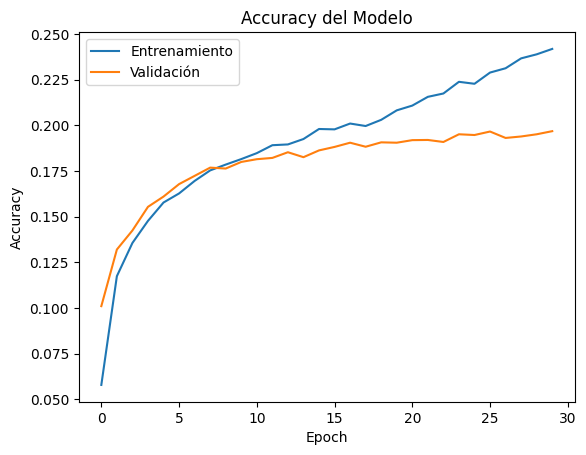

In [37]:
plt.plot(history.history['accuracy'], label='Entrenamiento')
plt.plot(history.history['val_accuracy'], label='Validación')
plt.title('Accuracy del Modelo')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

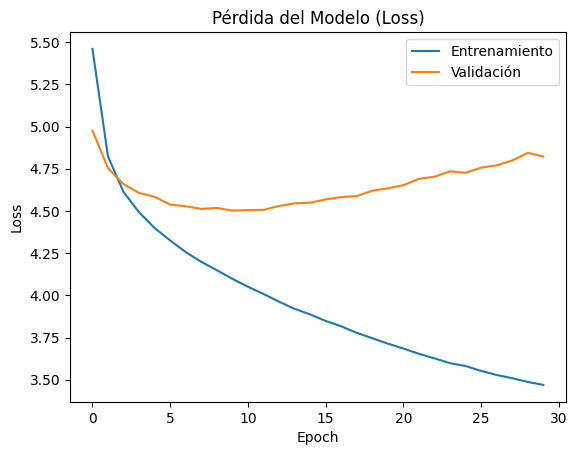

In [38]:
plt.plot(history.history['loss'], label='Entrenamiento')
plt.plot(history.history['val_loss'], label='Validación')
plt.title('Pérdida del Modelo (Loss)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

El gráfico de pérdida demuestra signos de sobreajuste ya que la pérdida en entrenamiento baja considerablemente pero en validación se mantiene estable y más alto que en entrenamiento. Asimismo, el accuracy es bajo, posiblemente por dificultades con la distinción entre tantos géneros.

**Matriz de confusión**

In [39]:
y_pred_probs = mod_clas.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

#etiquetas unicas
index_presentes = np.unique(y_test)
nombres_presentes = [le.classes_[i] for i in index_presentes]

print(classification_report(y_test, y_pred, labels=index_presentes, target_names=nombres_presentes, zero_division=0))

390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
                                                                                                        precision    recall  f1-score   support

                                               Arqueología - Ciencias naturales - Divulgación - Ensayo       0.00      0.00      0.00         1
                                                                      Arqueología - Crónica - Historia       0.00      0.00      0.00         1
                                                                             Arqueología - Divulgación       0.00      0.00      0.00         4
                                                         Arqueología - Divulgación - Ensayo - Historia       0.00      0.00      0.00         1
                                            Arqueología - Humor - Otros - Poesía - Referencia - Sátira       1.00      1.00      1.00         1
                                                     Arquitectura - Arte - Crónica - Ensayo - 

Se afirma que la baja precisión (accuracy) probablemente es por la gran variedad de clases en la variable 'Géneros'. Se usrá KMeans para ver en realidad cuántos clusters en realidad debería usarse.

In [40]:
from sklearn.cluster import KMeans

In [41]:
inertias = []
k_range = range(2, 15)
for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10).fit(X_train)
    inertias.append(km.inertia_)

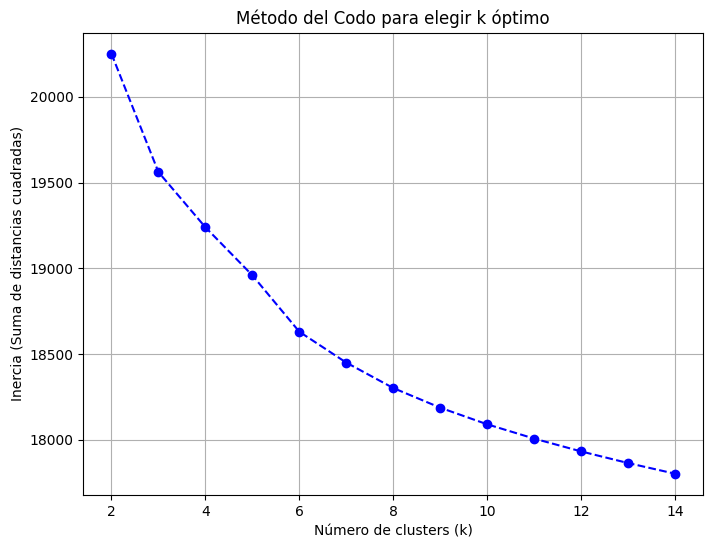

In [42]:
plt.figure(figsize=(8, 6))
plt.plot(k_range, inertias, marker='o', linestyle='--', color='b')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia (Suma de distancias cuadradas)')
plt.title('Método del Codo para elegir k óptimo')
plt.grid(True)
plt.show()

La curva obtenida es bastante suave. Lo que demuestra que los embeddings tienen o comparten un campo semántico bastante uniforme entre ellos. Se contínua con la graficación para verificar si k debería ser, por ej., ocho.

In [43]:
k_opt = 8
kmeans = KMeans(n_clusters=k_opt, n_init=10, random_state=42)
clusters = kmeans.fit_predict(sinopsis_vect)

selec_data_clusters = selec_data.copy()
selec_data_clusters['cluster_id'] = clusters

In [44]:
for i in range(8):
    print(f"____ Cluster {i}: ____")
    print(selec_data_clusters[selec_data_clusters['cluster_id'] == i]['generos'].value_counts().head(3))

____ Cluster 0: ____
generos
Intriga - Novela - Policíaco    88
Novela - Romántico              86
Novela - Policíaco              81
Name: count, dtype: int64
____ Cluster 1: ____
generos
Histórico - Novela        536
Ensayo - Historia         494
Divulgación - Historia    474
Name: count, dtype: int64
____ Cluster 2: ____
generos
Ciencia ficción - Novela    487
Novela - Policíaco          434
Histórico - Novela          432
Name: count, dtype: int64
____ Cluster 3: ____
generos
Novela - Romántico    1302
Intriga - Novela       693
Drama - Novela         463
Name: count, dtype: int64
____ Cluster 4: ____
generos
Ciencias sociales - Ensayo    424
Ciencia ficción - Novela      358
Ensayo - Filosofía            354
Name: count, dtype: int64
____ Cluster 5: ____
generos
Novela - Policíaco    805
Histórico - Novela    794
Intriga - Novela      663
Name: count, dtype: int64
____ Cluster 6: ____
generos
Novela - Policíaco              757
Intriga - Novela - Policíaco    577
Intriga - Novela 

Como hay clusters algo ambiguos, se chequea el valor k=8 con Silouette.

In [45]:
from sklearn.metrics import silhouette_score

In [46]:
indices_muestra = np.random.choice(len(X), size=15000, replace=False)
X_muestra = X[indices_muestra]
labels_muestra = clusters[indices_muestra]

score = silhouette_score(X_muestra, labels_muestra)
print(f"Coeficiente de Silueta para k=8: {score:.4f}")

Coeficiente de Silueta para k=8: 0.2470


Dividir los embeddings en ocho clusters parece ser correcto. Los clusters parece que son algo parecidos pero pueden dividirse entre sí.

#### Distancias y búsqueda

Con el mismo dataset, pero usando estas variables, se construye un pequeño sistema de búsqueda que, dado el nombre de un autor, devuelva los más similares en el dataset.

In [47]:
from sklearn.metrics import jaccard_score
from Levenshtein import distance as lst
from sklearn.feature_extraction.text import CountVectorizer

Con Levenshtein:

In [48]:
autores = data[['autor', 'titulo']]

In [49]:
def chequeo_autores_lev(ingreso, dataset=autores, umbral=10):
    total_autores_dataset = dataset['autor'].dropna().unique().astype(str)

    mejor_score = 10
    autor_elegido = None
    for i, autor in enumerate(total_autores_dataset):
        dist_levens = lst(ingreso, autor)

        if dist_levens < mejor_score:
            mejor_score = dist_levens
            autor_elegido = total_autores_dataset[i]
    
    if mejor_score <= umbral:
        return str([autor_elegido, mejor_score])
    else:
        return "No se encontró una coincidencia clara"


In [50]:
print(chequeo_autores_lev('Edgar A Poe'))

['Edgar Allan Poe', 4]


Con Jaccard:

In [51]:
def chequeo_autores(ingreso, dataset=autores, umbral=0.6):
    total_autores_dataset = dataset['autor'].dropna().unique().astype(str)

    vectorizer = CountVectorizer(analyzer='char', ngram_range=(2, 3), binary=True)
    documentos = np.append(total_autores_dataset, ingreso)
    aut_vect = vectorizer.fit_transform(documentos)

    vect_ingreso = aut_vect[-1].toarray()[0]
    vect_autores = aut_vect[:-1].toarray()

    mejor_score = 0
    autor_elegido = None
    for i, autor in enumerate(vect_autores):
        puntaje_jacc = jaccard_score(vect_ingreso, autor, average='binary')

        if puntaje_jacc > mejor_score:
            mejor_score = puntaje_jacc
            autor_elegido = total_autores_dataset[i]
    
    if mejor_score >= umbral:
        return [autor_elegido, round(mejor_score, 2)]
    else:
        return "No se encontró una coincidencia clara"

In [52]:
print(chequeo_autores('Edgar All Poe'))

['Edgar Allan Poe', 0.67]


#### Detección de entidades con POS y NER

Modelo para parte NER:

In [53]:
from gliner import GLiNER
from huggingface_hub import snapshot_download

In [54]:
model_id = 'urchade/gliner_multi-v2.1'

# Modelo descargado en una carpeta local específica evitando los symlinks
local_model_path = snapshot_download(
    repo_id=model_id,
    local_dir_use_symlinks=False, 
    local_dir="./gliner_model_local")


modelo = GLiNER.from_pretrained(local_model_path)
modelo.eval()
print("SISTEMA CARGADO")

d:\Programas\anaconda3\envs\Python_ML\lib\site-packages\huggingface_hub\file_download.py:979: UserWarning:

`local_dir_use_symlinks` parameter is deprecated and will be ignored. The process to download files to a local folder has been updated and do not rely on symlinks anymore. You only need to pass a destination folder as`local_dir`.
For more details, check out https://huggingface.co/docs/huggingface_hub/main/en/guides/download#download-files-to-local-folder.



Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

d:\Programas\anaconda3\envs\Python_ML\lib\site-packages\transformers\convert_slow_tokenizer.py:566: UserWarning:

The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.



SISTEMA CARGADO


Modelo para parte POS:

In [55]:
import spacy

In [56]:
mod_nlp = spacy.load('es_core_news_lg')

Detección de nombres de autores.

In [57]:
def validacion_autores(ingreso, dataset=autores):
    txt = mod_nlp(ingreso)
    if any(token.pos_ in ['PROPN', 'NOUN'] for token in txt):
        labels = ["person"]
        entidades = modelo.predict_entities(ingreso, labels, threshold=0.4)
        if not entidades:
            print("Sustantivo no propio")
            return
        
        score_jac = chequeo_autores(ingreso)
        if isinstance(score_jac, list):
            nombre_valido = score_jac[0]
            puntaje_jac = score_jac[1]
            
            obras = dataset[dataset['autor']==nombre_valido]
        
            if obras.empty:
                return f"Autor detectado: {nombre_valido}, Similitud: {puntaje_jac}"
        else:
            return score_jac

        return obras
    else:
        print("La frase ingresada no es un nombre de autor.")

In [58]:
print(validacion_autores("Edgar All Poe"))

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


                 autor                                             titulo
958    Edgar Allan Poe  Los crímenes de la calle Morgue y otras histor...
1208   Edgar Allan Poe                                 Relatos del abismo
4188   Edgar Allan Poe            El gato negro y otros relatos de terror
4249   Edgar Allan Poe                                    Poesía completa
10404  Edgar Allan Poe  La carta robada y otros relatos (Ed. Mauro Arm...
11251  Edgar Allan Poe                                             Eureka
11499  Edgar Allan Poe  El escarabajo de oro y otros relatos (Trad. Ro...
14501  Edgar Allan Poe                                  La trilogía Dupin
21864  Edgar Allan Poe                         El silencio y otros poemas
23100  Edgar Allan Poe                          El gato negro (Ilustrado)
23487  Edgar Allan Poe          Biblioteca universal de misterio y terror
23548  Edgar Allan Poe          La narración de A. Gordon Pym (Ilustrado)
23741  Edgar Allan Poe   El escarabajo

In [59]:
print(validacion_autores("ministerio"))

Sustantivo no propio
None


In [60]:
print(validacion_autores("Mary Shelley"))

              autor                                             titulo
1519   Mary Shelley       El mortal inmortal y otras fantasías góticas
6156   Mary Shelley                                    Diario de duelo
18394  Mary Shelley                   Maurice o la cabaña del pescador
22479  Mary Shelley               Historia de un viaje de seis semanas
22690  Mary Shelley  Frankenstein. Edición anotada para científicos...
22861  Mary Shelley                           Frankenstein (Ilustrado)
28274  Mary Shelley                                   El último hombre
33182  Mary Shelley                                   Cervantes y Lope
34999  Mary Shelley                Frankenstein, o el moderno Prometeo
41697  Mary Shelley  Frankenstein, o El moderno Prometeo (trad. Sil...
41974  Mary Shelley  Frankenstein o el moderno Prometeo (Ilustrado)...
53819  Mary Shelley                             Mary; Maria / Mathilda
55183  Mary Shelley                                    Cuentos góticos
62275 

#### Integrador: Sistema de Recomendación

In [68]:
df_int = data[['autor', 'titulo', 'generos']]

In [69]:
df_int_reset = df_int.reset_index(drop=True)
df_sinopsis_vect = pd.DataFrame(sinopsis_vect)

df_int_vect = pd.concat([df_int_reset, df_sinopsis_vect], axis=1)

In [77]:
df_int_vect.head()

,autor,titulo,generos,0,1,2,3,4,5,6,...,374,375,376,377,378,379,380,381,382,383
0,Jota Quijorna,Tierra feroz,Intriga - Novela,0.001938,0.026412,-0.039407,-0.002743,-0.085086,-0.024520,0.058746,...,0.003407,-0.095957,0.065657,0.054315,-0.037728,-0.000764,0.058187,0.049915,0.006513,-0.043640
1,Ursula K. Le Guin,Tehanu,Fantástico - Novela,0.019917,0.064344,0.015942,-0.056936,0.020456,-0.019883,0.025816,...,0.006856,-0.114414,0.080516,0.047948,-0.055438,0.009802,0.088668,0.035764,-0.088391,-0.058542
2,Sylvain Prudhomme,El niño del taxi,Histórico - Novela,-0.014760,0.045554,-0.027613,-0.041969,-0.018654,0.022171,0.056531,...,0.053774,-0.030686,0.018171,0.144660,-0.006564,0.073019,0.128125,0.084577,0.036356,-0.104803
3,Gerard Christopher Klug,James Bond 007: El juego de rol,Juegos - Manuales y cursos - Referencia,-0.028299,0.054562,-0.091295,-0.092130,-0.054963,0.053765,0.064522,...,0.056061,-0.049880,0.016384,0.010363,-0.081469,-0.011914,0.131768,-0.022580,0.055972,-0.023893
4,Alissa Brontë,El retorno del cuervo,Histórico - Novela - Romántico,-0.016074,0.008780,-0.019143,-0.018547,-0.016573,-0.006981,0.025273,...,0.041120,-0.084641,0.044351,0.058096,-0.001674,-0.020668,0.069144,0.038278,0.008187,-0.107594


Teniendo en cuenta algunas prácticas anteriores, se finaliza esta práctica con un pequeño proyecto integrador cuyo objetivo es un sitema de recomendación de obras o géneros literarios, según las pabras ingresadas del usuario.

In [78]:
from sklearn.metrics.pairwise import cosine_similarity

In [131]:
def sist_recom(ingreso, df=df_int_vect):
    val_autor = chequeo_autores(ingreso)[0]
    if len(val_autor) > 1:
        select_autor = df[df['autor'] == val_autor]
        select_autor_embe = select_autor.iloc[:, 3:]
        simil_sinopsis = cosine_similarity(select_autor_embe[0:1], select_autor_embe[1:])

        puntajes = simil_sinopsis.flatten()
        serie_simil = pd.Series(puntajes, index=select_autor.index[1:])
        serie_simil_ordenado = serie_simil.sort_values(ascending=False).index
        recomendaciones = select_autor.loc[serie_simil_ordenado]
        top_10 = pd.DataFrame(recomendaciones[['titulo', 'generos']].head(10))
        print(f"Top 10 de recomendaciones sobre {val_autor}")
        return top_10
    else:
        embedding_usuario = model.encode([ingreso])
        embeddings = df.iloc[:, 3:]
        simil_coseno = cosine_similarity(embedding_usuario, embeddings)
        
        puntajes = simil_coseno.flatten()
        serie_simil = pd.Series(puntajes, index=df.index)
        serie_simil_ordenado = serie_simil.sort_values(ascending=False).index
        recomendaciones = df.loc[serie_simil_ordenado]
        top_10 = recomendaciones[['autor', 'titulo', 'generos']].head(10)
        print(f"Top 10 de recomendaciones en base a: {ingreso}")
        return top_10


In [129]:
sist_recom('Edgar Alan Poe')

Top 10 de recomendaciones sobre Edgar Allan Poe


,titulo,generos
14501,La trilogía Dupin,Intriga - Policíaco - Relato
51584,Narración de Arthur Gordon Pym,Aventuras - Fantástico - Novela - Terror
23548,La narración de A. Gordon Pym (Ilustrado),Aventuras - Drama - Novela
36428,Cuentos completos (Penguin Clásicos),Relato - Sátira - Terror
23741,El escarabajo de oro y otros cuentos (Ilustrado),Intriga - Policíaco - Relato
29541,Los extraordinarios casos de monsieur Dupin,Intriga - Relato
57734,Cuentos completos (trad. Julio Cortázar),Cuentos - Recopilación - Relato
1208,Relatos del abismo,Fantástico - Intriga - Policíaco - Relato - Te...
11499,El escarabajo de oro y otros relatos (Trad. Ro...,Aventuras - Intriga - Relato - Terror
39276,El barril de amontillado,Relato - Terror


In [132]:
sist_recom('fantasía oscura')

Top 10 de recomendaciones en base a: fantasía oscura


,autor,titulo,generos
35838,Geronimo Stilton,El anillo de luz,Aventuras - Infantil - Juvenil - Novela
38925,Geronimo Stilton,La puerta encantada,Aventuras - Infantil - Juvenil - Novela
45782,Arturo Mengotti,Nueva Dimensión 3,Ciencia ficción - Crítica y teoría literaria -...
32778,A. E. van Vogt,Nueva Dimensión 7,Ciencia ficción - Crítica y teoría literaria -...
33880,Alfonso Alvarez Villar,Nueva Dimensión 5,Ciencia ficción - Crítica y teoría literaria -...
33916,Alfonso Alvarez Villar,Nueva Dimensión 5,Ciencia ficción - Crítica y teoría literaria -...
40632,A. E. van Vogt,Nueva Dimensión 1,Ciencia ficción - Crítica y teoría literaria -...
40635,Fritz Leiber,Nueva Dimensión 144,Ciencia ficción - Crítica y teoría literaria -...
40981,Gene Wolfe,Nueva Dimensión 147,Ciencia ficción - Crítica y teoría literaria -...
41097,A. E. van Vogt,Nueva Dimensión 4,Ciencia ficción - Crítica y teoría literaria -...
